## Домашнее задание №4
### Deadline - 14 November 23:59

Данное задание посвящено семантической сегментации. Ваша цель реализовать модель сегментации cпутниковых снимков на датасете [FloodNet Challenge](http://www.classic.grss-ieee.org/earthvision2021/challenge.html).. В первой части задания вы реализуете основные инструменты, которые необходимы для задачи сегментации: подсчет метрик, архитектуры, логгирование метрик. Во второй части вам предложено улучшить текущее решение и выбить заданные скор на задаче, используя любые трюки/идеи, которые вы сможете реализовать

In [59]:
import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import segmentation_models_pytorch as smp

from matplotlib import pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torch.utils.tensorboard import SummaryWriter
from torchvision.transforms import ToTensor, PILToTensor, Compose

import glob
import os
import numpy as np
import albumentations as A

from PIL import Image

## Часть 1: Базовое решение (1/3 от максимального числа баллов)
- Подсчет метрик
- Архитектуру модели (реализовать UNet)
- Обучение модели

### Loading dataset

In [5]:
!gdown --id 1vLTGoRO1zeQSZ0mfRTgVC9W6R5Z94UoO

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1vLTGoRO1zeQSZ0mfRTgVC9W6R5Z94UoO
To: /content/tiny-floodnet-challenge.tar.gz
100% 50.4M/50.4M [00:00<00:00, 135MB/s]


Распаковываем архив

In [6]:
!tar -xzf tiny-floodnet-challenge.tar.gz

### Dataset

Датасет уже содержит разбиение на обучающую и тестовые выборки

Для обработки изображений будем использовать библиотеку [albumentations](https://albumentations.ai/docs/). В ней содержиться больше аугментаций чем в torchvision, а также реализовано более удобная работа с аугментациями.

Реализуйте загрузку данных

In [7]:
class FloodNet(Dataset):
    """
    Классы:
    0: Background, 1: Building, 2: Road, 3: Water, 4: Tree, 5: Vehicle, 6: Pool, 7: Grass
    """
    def __init__(
        self,
        data_path: str,
        phase: str,
        augment: bool,
        img_size: int,
    ):
        self.num_classes = 8
        self.data_path = data_path
        self.phase = phase
        self.augment = augment
        self.img_size = img_size

        self.items = [filename.split('.')[0] for filename in os.listdir(f'{data_path}/{phase}/image')]

        if augment:
            self.transform = A.RandomResizedCrop(width=img_size, height=img_size)

        else:
            self.transform = A.RandomCrop(width=img_size, height=img_size)

        self.to_tensor = ToTensor()

    def __len__(self):
        return len(self.items)

    def __getitem__(self, index):
        image = np.asarray(Image.open(f'{self.data_path}/{self.phase}/image/{self.items[index]}.jpg'))
        mask = np.asarray(Image.open(f'{self.data_path}/{self.phase}/mask/{self.items[index]}.png'))

        augmented = self.transform(image=image, mask=mask)
        image = augmented['image']
        mask = augmented['mask']

        image = self.to_tensor(image.copy())
        mask = torch.from_numpy(mask.copy()).long()

        if self.phase == 'train':
            assert isinstance(image, torch.FloatTensor) and image.shape == (3, self.img_size, self.img_size)
            assert isinstance(mask, torch.LongTensor) and mask.shape == (self.img_size, self.img_size)

        return image, mask

In [8]:
NUM_CLASSES=8

In [9]:
train_dataset = FloodNet('tiny-floodnet-challenge', 'train', True, 256)
test_dataset = FloodNet('tiny-floodnet-challenge', 'test', False, 256)

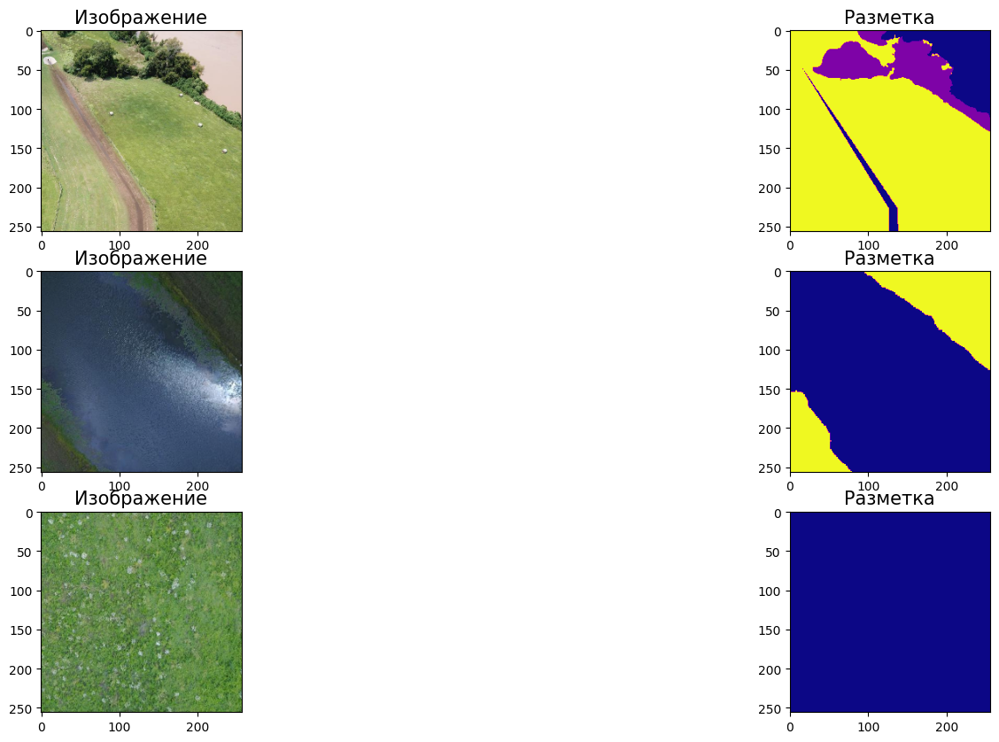

In [10]:
image_1, mask_1 = train_dataset[0]
image_2, mask_2 = train_dataset[1]
image_3, mask_3 = train_dataset[2]

plt.figure(figsize=(20, 10))

plt.subplot(3, 2, 1)
plt.imshow(np.transpose(image_1, (1, 2, 0)))
plt.title("Изображение", fontsize=15)

plt.subplot(3, 2, 2)
plt.imshow(mask_1, cmap='plasma')
plt.title("Разметка", fontsize=15)

plt.subplot(3, 2, 3)
plt.imshow(np.transpose(image_2, (1, 2, 0)))
plt.title("Изображение", fontsize=15)

plt.subplot(3, 2, 4)
plt.imshow(mask_2, cmap='plasma')
plt.title("Разметка", fontsize=15)

plt.subplot(3, 2, 5)
plt.imshow(np.transpose(image_3, (1, 2, 0)))
plt.title("Изображение", fontsize=15)

plt.subplot(3, 2, 6)
plt.imshow(mask_3, cmap='plasma')
plt.title("Разметка", fontsize=15)

plt.show()

Берем небольшой батч, так как иначе изображения не поместятся в память

In [11]:
train_dataloader = DataLoader(train_dataset, num_workers=2, batch_size=4, shuffle=True)

val_dataloader = DataLoader(test_dataset, num_workers=2, batch_size=1, shuffle=False)

### Metrics

Мы закончили с реализацией датасета. Теперь необходимо реализовать подсчет IoU, Recall, Accuracy

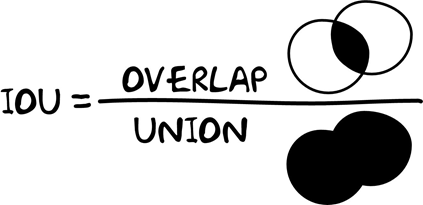

$mean IoU = \frac{1}{|classes|} \sum_{i=1}^{|classes|} IoU(class)$

Обновленные метрики от Матвея

In [21]:
def calc_val_data(preds, masks, num_classes):
    preds = torch.argmax(preds, dim=1)
    batch_size = preds.shape[0]

    intersection = [(torch.mul(preds == i, masks == i).sum(1).sum(-1)).unsqueeze(1) for i in range(num_classes)]
    union = [((preds == i).sum(1).sum(-1) + (masks == i).sum(1).sum(-1)).unsqueeze(1) - intersection[i] for i in range(num_classes)]
    target = [(masks == i).sum(1).sum(-1).unsqueeze(1) for i in range(num_classes)]

    intersection = torch.cat(intersection, dim=1)
    union = torch.cat(union, dim=1)
    target = torch.cat(target, dim=1)

    assert isinstance(intersection, torch.Tensor), 'Output should be a tensor'
    assert isinstance(union, torch.Tensor), 'Output should be a tensor'
    assert isinstance(target, torch.Tensor), 'Output should be a tensor'

    assert intersection.shape == union.shape == target.shape, 'Wrong output shape'
    assert union.shape[0] == masks.shape[0] and union.shape[1] == num_classes, 'Wrong output shape'

    return intersection, union, target

In [13]:
def calc_val_loss(intersection, union, target, eps=1e-7):
    mean_iou = torch.mean(torch.div(intersection + eps, union + eps))
    mean_class_rec = torch.mean(torch.div(intersection + eps, target + eps))
    mean_acc = torch.mean(1 - torch.div(union - intersection + eps, torch.sum(target, axis=0) + eps))

    return mean_iou, mean_class_rec, mean_acc

### Model

В качестве базовой модели будем использовать UNet. Архитектура представлена ниже. Вам не нужно точно воспроизвести архитектуру. Важно реализовать передачу intermediate features, полученные от encoder к decoder.

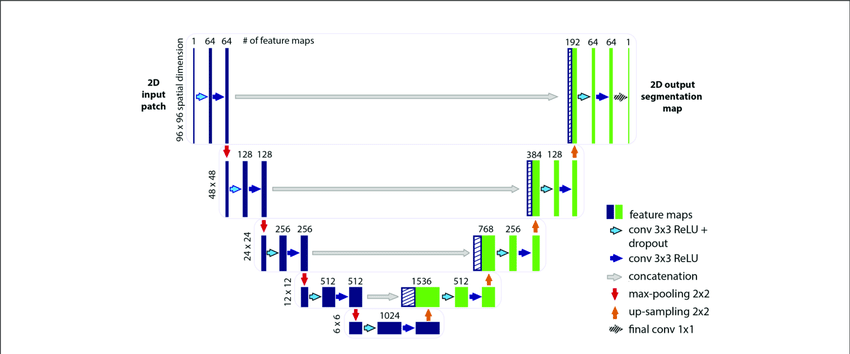

In [14]:
class DownBlock(nn.Module):
    def __init__(self, in_channel, out_channel, down=True):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channel, out_channel, padding=1, kernel_size=3)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(p=0.2)
        self.conv2 = nn.Conv2d(out_channel, out_channel, padding=1, kernel_size=3)

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu(x)
        x = self.dropout(x)
        x = self.conv2(x)
        x = self.relu(x)
        return x

In [15]:
class UpBlock(nn.Module):
    def __init__(self, in_channel, prev_channel, out_channel, up=True):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channel + prev_channel, out_channel, padding=1, kernel_size=3)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(p=0.2)
        self.conv2 = nn.Conv2d(in_channels=out_channel, out_channels=out_channel, padding=1, kernel_size=3)

    def forward(self, x, res=None):
        x = torch.cat([x, res], dim=1)
        x = self.conv1(x)
        x = self.relu(x)
        x = self.dropout(x)
        x = self.conv2(x)
        x = self.relu(x)
        return x

Теперь совместим encoder и decoder в одну архитектуру

In [16]:
class UNet(nn.Module):
    def __init__(self,
                 num_classes,
                 min_channels=32,
                 max_channels=512,
                 num_down_blocks=4):
        super(UNet, self).__init__()
        self.num_classes = num_classes
        self.num_down_blocks = num_down_blocks

        if max_channels != min_channels * (2 ** num_down_blocks):
            max_channels = min_channels * (2 ** num_down_blocks)

        self.down_block_0 =  DownBlock(3, min_channels)
        self.red_arrow_down = nn.MaxPool2d(kernel_size=2)
        self.red_arrow_up = nn.UpsamplingBilinear2d(scale_factor=2)
        self.final_conv = nn.Conv2d(min_channels, num_classes, padding=1, kernel_size=3)

        for i in range(self.num_down_blocks):
            setattr(self, "down_block_" + str(i + 1), DownBlock(min_channels * (2 ** i),
                                                                min_channels * (2 ** (i + 1))))

            setattr(self, "up_block_" + str(i + 1), UpBlock(max_channels // 2 ** i,
                                                            max_channels // 2 ** (i + 1),
                                                            max_channels // 2 ** (i + 1)))

    def forward(self, inputs):
        logits_temp = self.down_block_0(inputs)
        reses = [logits_temp]
        logits = self.red_arrow_down(logits_temp)
        for i in range(self.num_down_blocks):
            logits_temp = getattr(self, "down_block_" + str(i + 1))(logits)
            logits = self.red_arrow_down(logits_temp)
            reses.append(logits_temp)
        logits = reses[-1]

        for i in range(2, self.num_down_blocks + 2):
            logits = self.red_arrow_up(logits)
            logits = getattr(self, "up_block_" + str(i - 1))(logits, reses[-i])

        logits = self.final_conv(logits)

        assert logits.shape == (inputs.shape[0], self.num_classes, inputs.shape[2], inputs.shape[3]), 'Wrong shape of the logits'
        return logits

In [25]:
device='cuda:0'

m = UNet(NUM_CLASSES).to(device)

### Training

In [26]:
criterion = nn.CrossEntropyLoss()
optim = torch.optim.Adam(m.parameters(), lr=1e-4)
tb = SummaryWriter()

global_step = 0
for epoch in range(100):
    m.train()
    for batch in tqdm.tqdm(train_dataloader, position=0):
        x, y = batch[0].to(device), batch[1].to(device)
        pred = m(x)
        loss = criterion(pred, y)

        tb.add_scalar("train_loss", loss.item(), global_step)
        optim.zero_grad()
        loss.backward()
        optim.step()

        global_step += 1

    intersection, union, target = 0.0, 0.0, 0.0
    with torch.no_grad():
        m.eval()
        for batch in tqdm.tqdm(val_dataloader):
            x, y = batch[0].to(device), batch[1].to(device)
            pred = m(x)

            loss = criterion(pred, y)

            tmp_intersection, tmp_union, tmp_target = calc_val_data(pred, y, 8)
            intersection += tmp_intersection.sum(0)
            union += tmp_union.sum(0)
            target += tmp_target.sum(0)

    mean_iou, mean_class_rec, mean_acc = calc_val_loss(intersection, union, target, eps = 1e-7)

    print(f"Epoch {epoch}, val_mIoU={mean_iou}, val_mRecall={mean_class_rec}, val_mAcc={mean_acc}")
    tb.add_scalar("val_mean_iou", mean_iou, epoch)
    tb.add_scalar("val_mean_class_rec", mean_class_rec, epoch)
    tb.add_scalar("val_mean_acc", mean_acc, epoch)

100%|██████████| 35/35 [00:00<00:00, 58.89it/s]


Epoch 0, val_mIoU=0.05285513773560524, val_mRecall=0.125, val_mAcc=0.8557102680206299


100%|██████████| 35/35 [00:00<00:00, 59.60it/s]


Epoch 1, val_mIoU=0.04493588209152222, val_mRecall=0.125, val_mAcc=0.8398717641830444


100%|██████████| 35/35 [00:00<00:00, 35.58it/s]


Epoch 2, val_mIoU=0.05793462321162224, val_mRecall=0.125, val_mAcc=0.8658692240715027


100%|██████████| 35/35 [00:00<00:00, 59.94it/s]


Epoch 3, val_mIoU=0.051131222397089005, val_mRecall=0.125, val_mAcc=0.8522624373435974


100%|██████████| 35/35 [00:01<00:00, 33.91it/s]


Epoch 4, val_mIoU=0.04804562032222748, val_mRecall=0.125, val_mAcc=0.8460912704467773


100%|██████████| 35/35 [00:00<00:00, 59.51it/s]


Epoch 5, val_mIoU=0.04601854458451271, val_mRecall=0.125, val_mAcc=0.8420370817184448


100%|██████████| 35/35 [00:00<00:00, 37.25it/s]


Epoch 6, val_mIoU=0.061605289578437805, val_mRecall=0.125, val_mAcc=0.8732105493545532


100%|██████████| 35/35 [00:00<00:00, 59.06it/s]


Epoch 7, val_mIoU=0.10148042440414429, val_mRecall=0.18442001938819885, val_mAcc=0.866783857345581


100%|██████████| 35/35 [00:00<00:00, 60.24it/s]


Epoch 8, val_mIoU=0.09425795823335648, val_mRecall=0.16554661095142365, val_mAcc=0.8745272159576416


100%|██████████| 35/35 [00:00<00:00, 58.64it/s]


Epoch 9, val_mIoU=0.11817605793476105, val_mRecall=0.2090802788734436, val_mAcc=0.8764719367027283


100%|██████████| 35/35 [00:00<00:00, 59.59it/s]


Epoch 10, val_mIoU=0.1317901611328125, val_mRecall=0.23120921850204468, val_mAcc=0.8839781880378723


100%|██████████| 35/35 [00:00<00:00, 58.87it/s]


Epoch 11, val_mIoU=0.11213444918394089, val_mRecall=0.19737102091312408, val_mAcc=0.8831120729446411


100%|██████████| 35/35 [00:01<00:00, 25.06it/s]


Epoch 12, val_mIoU=0.08379869908094406, val_mRecall=0.14604414999485016, val_mAcc=0.8699613213539124


100%|██████████| 35/35 [00:01<00:00, 33.83it/s]


Epoch 13, val_mIoU=0.10818415880203247, val_mRecall=0.18620991706848145, val_mAcc=0.8636645078659058


100%|██████████| 35/35 [00:00<00:00, 59.71it/s]


Epoch 14, val_mIoU=0.0784720778465271, val_mRecall=0.1389501541852951, val_mAcc=0.8577888011932373


100%|██████████| 35/35 [00:00<00:00, 37.52it/s]


Epoch 15, val_mIoU=0.06094912439584732, val_mRecall=0.129619300365448, val_mAcc=0.8502861261367798


100%|██████████| 35/35 [00:00<00:00, 58.09it/s]


Epoch 16, val_mIoU=0.10976193845272064, val_mRecall=0.18400737643241882, val_mAcc=0.8555430173873901


100%|██████████| 35/35 [00:00<00:00, 59.25it/s]


Epoch 17, val_mIoU=0.0763472467660904, val_mRecall=0.1405298113822937, val_mAcc=0.8571454286575317


100%|██████████| 35/35 [00:00<00:00, 60.55it/s]


Epoch 18, val_mIoU=0.20141009986400604, val_mRecall=0.25954705476760864, val_mAcc=0.8632857203483582


100%|██████████| 35/35 [00:01<00:00, 29.66it/s]


Epoch 19, val_mIoU=0.13404136896133423, val_mRecall=0.22240066528320312, val_mAcc=0.8716268539428711


100%|██████████| 35/35 [00:00<00:00, 59.07it/s]


Epoch 20, val_mIoU=0.08678761124610901, val_mRecall=0.16042464971542358, val_mAcc=0.8553207516670227


100%|██████████| 35/35 [00:01<00:00, 33.42it/s]


Epoch 21, val_mIoU=0.12302977591753006, val_mRecall=0.20287781953811646, val_mAcc=0.8648488521575928


100%|██████████| 35/35 [00:00<00:00, 61.13it/s]


Epoch 22, val_mIoU=0.18292708694934845, val_mRecall=0.25649818778038025, val_mAcc=0.8838352560997009


100%|██████████| 35/35 [00:00<00:00, 58.05it/s]


Epoch 23, val_mIoU=0.16378802061080933, val_mRecall=0.26947706937789917, val_mAcc=0.8745265007019043


100%|██████████| 35/35 [00:00<00:00, 59.58it/s]


Epoch 24, val_mIoU=0.1562526822090149, val_mRecall=0.24316158890724182, val_mAcc=0.8806482553482056


100%|██████████| 35/35 [00:00<00:00, 59.08it/s]


Epoch 25, val_mIoU=0.1075422614812851, val_mRecall=0.18969884514808655, val_mAcc=0.8737724423408508


100%|██████████| 35/35 [00:01<00:00, 34.85it/s]


Epoch 26, val_mIoU=0.20529481768608093, val_mRecall=0.2933294475078583, val_mAcc=0.8903218507766724


100%|██████████| 35/35 [00:00<00:00, 60.22it/s]


Epoch 27, val_mIoU=0.0647064819931984, val_mRecall=0.14226138591766357, val_mAcc=0.8401931524276733


100%|██████████| 35/35 [00:01<00:00, 34.61it/s]


Epoch 28, val_mIoU=0.11493587493896484, val_mRecall=0.1986672580242157, val_mAcc=0.8634113669395447


100%|██████████| 35/35 [00:00<00:00, 58.72it/s]


Epoch 29, val_mIoU=0.15445275604724884, val_mRecall=0.23855024576187134, val_mAcc=0.8740832805633545


100%|██████████| 35/35 [00:00<00:00, 42.76it/s]


Epoch 30, val_mIoU=0.11584045737981796, val_mRecall=0.1950771063566208, val_mAcc=0.8753838539123535


100%|██████████| 35/35 [00:00<00:00, 60.55it/s]


Epoch 31, val_mIoU=0.15309646725654602, val_mRecall=0.24063095450401306, val_mAcc=0.876873254776001


100%|██████████| 35/35 [00:00<00:00, 58.43it/s]


Epoch 32, val_mIoU=0.21285052597522736, val_mRecall=0.3030586838722229, val_mAcc=0.8995895385742188


100%|██████████| 35/35 [00:00<00:00, 58.25it/s]


Epoch 33, val_mIoU=0.17495454847812653, val_mRecall=0.25418156385421753, val_mAcc=0.8947871923446655


100%|██████████| 35/35 [00:00<00:00, 60.53it/s]


Epoch 34, val_mIoU=0.18123731017112732, val_mRecall=0.27461838722229004, val_mAcc=0.8819637298583984


100%|██████████| 35/35 [00:00<00:00, 59.55it/s]


Epoch 35, val_mIoU=0.18274074792861938, val_mRecall=0.2593391537666321, val_mAcc=0.8922219276428223


100%|██████████| 35/35 [00:00<00:00, 59.82it/s]


Epoch 36, val_mIoU=0.23229022324085236, val_mRecall=0.3221621513366699, val_mAcc=0.8951379060745239


100%|██████████| 35/35 [00:01<00:00, 34.11it/s]


Epoch 37, val_mIoU=0.22661182284355164, val_mRecall=0.3087518513202667, val_mAcc=0.9076238870620728


100%|██████████| 35/35 [00:00<00:00, 59.47it/s]


Epoch 38, val_mIoU=0.2081129401922226, val_mRecall=0.31313034892082214, val_mAcc=0.8853015899658203


100%|██████████| 35/35 [00:01<00:00, 34.06it/s]


Epoch 39, val_mIoU=0.160588800907135, val_mRecall=0.24509015679359436, val_mAcc=0.8827009201049805


100%|██████████| 35/35 [00:00<00:00, 60.45it/s]


Epoch 40, val_mIoU=0.18822018802165985, val_mRecall=0.2806868553161621, val_mAcc=0.8911229372024536


100%|██████████| 35/35 [00:00<00:00, 41.32it/s]


Epoch 41, val_mIoU=0.1227264404296875, val_mRecall=0.21568357944488525, val_mAcc=0.864033579826355


100%|██████████| 35/35 [00:00<00:00, 59.42it/s]


Epoch 42, val_mIoU=0.23504206538200378, val_mRecall=0.32653769850730896, val_mAcc=0.8885440230369568


100%|██████████| 35/35 [00:00<00:00, 59.91it/s]


Epoch 43, val_mIoU=0.24815581738948822, val_mRecall=0.33563995361328125, val_mAcc=0.9114925861358643


100%|██████████| 35/35 [00:00<00:00, 58.30it/s]


Epoch 44, val_mIoU=0.1575266569852829, val_mRecall=0.25703585147857666, val_mAcc=0.8767653107643127


100%|██████████| 35/35 [00:00<00:00, 57.46it/s]


Epoch 45, val_mIoU=0.16497360169887543, val_mRecall=0.24886956810951233, val_mAcc=0.8631335496902466


100%|██████████| 35/35 [00:00<00:00, 59.63it/s]


Epoch 46, val_mIoU=0.10711021721363068, val_mRecall=0.2066059708595276, val_mAcc=0.8437576293945312


100%|██████████| 35/35 [00:00<00:00, 58.47it/s]


Epoch 47, val_mIoU=0.19042086601257324, val_mRecall=0.27081575989723206, val_mAcc=0.8772116899490356


100%|██████████| 35/35 [00:01<00:00, 32.35it/s]


Epoch 48, val_mIoU=0.19863566756248474, val_mRecall=0.2852431535720825, val_mAcc=0.8841217160224915


100%|██████████| 35/35 [00:00<00:00, 60.96it/s]


Epoch 49, val_mIoU=0.2229481041431427, val_mRecall=0.3103312849998474, val_mAcc=0.9059574604034424


100%|██████████| 35/35 [00:01<00:00, 34.83it/s]


Epoch 50, val_mIoU=0.20922145247459412, val_mRecall=0.3195134401321411, val_mAcc=0.8890474438667297


100%|██████████| 35/35 [00:00<00:00, 60.92it/s]


Epoch 51, val_mIoU=0.21251443028450012, val_mRecall=0.32536575198173523, val_mAcc=0.8821254968643188


100%|██████████| 35/35 [00:00<00:00, 46.29it/s]


Epoch 52, val_mIoU=0.21724361181259155, val_mRecall=0.307369202375412, val_mAcc=0.8960707187652588


100%|██████████| 35/35 [00:00<00:00, 60.68it/s]


Epoch 53, val_mIoU=0.2402312457561493, val_mRecall=0.3511595129966736, val_mAcc=0.9015171527862549


100%|██████████| 35/35 [00:00<00:00, 60.07it/s]


Epoch 54, val_mIoU=0.25656843185424805, val_mRecall=0.35672900080680847, val_mAcc=0.9017130136489868


100%|██████████| 35/35 [00:00<00:00, 59.99it/s]


Epoch 55, val_mIoU=0.26239991188049316, val_mRecall=0.3754229247570038, val_mAcc=0.9089357852935791


100%|██████████| 35/35 [00:00<00:00, 58.86it/s]


Epoch 56, val_mIoU=0.21028545498847961, val_mRecall=0.30512815713882446, val_mAcc=0.8967480063438416


100%|██████████| 35/35 [00:00<00:00, 56.47it/s]


Epoch 57, val_mIoU=0.20241475105285645, val_mRecall=0.31238001585006714, val_mAcc=0.879865288734436


100%|██████████| 35/35 [00:00<00:00, 61.90it/s]


Epoch 58, val_mIoU=0.30100202560424805, val_mRecall=0.40846195816993713, val_mAcc=0.9143304824829102


100%|██████████| 35/35 [00:00<00:00, 35.69it/s]


Epoch 59, val_mIoU=0.21496030688285828, val_mRecall=0.3142493963241577, val_mAcc=0.8945698738098145


100%|██████████| 35/35 [00:00<00:00, 58.37it/s]


Epoch 60, val_mIoU=0.2596362829208374, val_mRecall=0.36836376786231995, val_mAcc=0.9018157720565796


100%|██████████| 35/35 [00:00<00:00, 35.37it/s]


Epoch 61, val_mIoU=0.31805741786956787, val_mRecall=0.4306257963180542, val_mAcc=0.9146003723144531


100%|██████████| 35/35 [00:00<00:00, 60.37it/s]


Epoch 62, val_mIoU=0.3048173189163208, val_mRecall=0.39481645822525024, val_mAcc=0.9195865392684937


100%|██████████| 35/35 [00:00<00:00, 38.32it/s]


Epoch 63, val_mIoU=0.23597463965415955, val_mRecall=0.355377733707428, val_mAcc=0.8919323682785034


100%|██████████| 35/35 [00:00<00:00, 50.57it/s]


Epoch 64, val_mIoU=0.2973509430885315, val_mRecall=0.3935786485671997, val_mAcc=0.9222738742828369


100%|██████████| 35/35 [00:00<00:00, 58.41it/s]


Epoch 65, val_mIoU=0.21900224685668945, val_mRecall=0.30734512209892273, val_mAcc=0.8988711833953857


100%|██████████| 35/35 [00:00<00:00, 61.44it/s]


Epoch 66, val_mIoU=0.24155783653259277, val_mRecall=0.35429757833480835, val_mAcc=0.9003146290779114


100%|██████████| 35/35 [00:01<00:00, 30.52it/s]


Epoch 67, val_mIoU=0.2897307276725769, val_mRecall=0.3928501307964325, val_mAcc=0.9151738882064819


100%|██████████| 35/35 [00:00<00:00, 63.86it/s]


Epoch 68, val_mIoU=0.20909257233142853, val_mRecall=0.3023430109024048, val_mAcc=0.8804877996444702


100%|██████████| 35/35 [00:00<00:00, 43.42it/s]


Epoch 69, val_mIoU=0.24940645694732666, val_mRecall=0.3679373264312744, val_mAcc=0.9005539417266846


100%|██████████| 35/35 [00:00<00:00, 60.72it/s]


Epoch 70, val_mIoU=0.3009943962097168, val_mRecall=0.40239274501800537, val_mAcc=0.911463737487793


100%|██████████| 35/35 [00:00<00:00, 58.07it/s]


Epoch 71, val_mIoU=0.24317556619644165, val_mRecall=0.3415374457836151, val_mAcc=0.8981486558914185


100%|██████████| 35/35 [00:00<00:00, 56.03it/s]


Epoch 72, val_mIoU=0.3793611526489258, val_mRecall=0.47561606764793396, val_mAcc=0.905895471572876


100%|██████████| 35/35 [00:00<00:00, 59.79it/s]


Epoch 73, val_mIoU=0.266482949256897, val_mRecall=0.3668419122695923, val_mAcc=0.9067766666412354


100%|██████████| 35/35 [00:00<00:00, 60.86it/s]


Epoch 74, val_mIoU=0.20825845003128052, val_mRecall=0.31614312529563904, val_mAcc=0.887846827507019


100%|██████████| 35/35 [00:00<00:00, 59.80it/s]


Epoch 75, val_mIoU=0.22613398730754852, val_mRecall=0.3187349736690521, val_mAcc=0.8976814150810242


100%|██████████| 35/35 [00:01<00:00, 33.45it/s]


Epoch 76, val_mIoU=0.2188241183757782, val_mRecall=0.3026427626609802, val_mAcc=0.8907318115234375


100%|██████████| 35/35 [00:00<00:00, 60.35it/s]


Epoch 77, val_mIoU=0.2460647076368332, val_mRecall=0.34770774841308594, val_mAcc=0.9015244841575623


100%|██████████| 35/35 [00:01<00:00, 34.14it/s]


Epoch 78, val_mIoU=0.19896528124809265, val_mRecall=0.28954920172691345, val_mAcc=0.8947157859802246


100%|██████████| 35/35 [00:00<00:00, 60.07it/s]


Epoch 79, val_mIoU=0.15028712153434753, val_mRecall=0.2588948607444763, val_mAcc=0.8645006418228149


100%|██████████| 35/35 [00:00<00:00, 38.57it/s]


Epoch 80, val_mIoU=0.2828795313835144, val_mRecall=0.3811195492744446, val_mAcc=0.9116786122322083


100%|██████████| 35/35 [00:00<00:00, 60.48it/s]


Epoch 81, val_mIoU=0.25601741671562195, val_mRecall=0.3553794324398041, val_mAcc=0.9108691215515137


100%|██████████| 35/35 [00:00<00:00, 59.17it/s]


Epoch 82, val_mIoU=0.2875440716743469, val_mRecall=0.4006035029888153, val_mAcc=0.9142252206802368


100%|██████████| 35/35 [00:00<00:00, 59.81it/s]


Epoch 83, val_mIoU=0.3569253981113434, val_mRecall=0.46196842193603516, val_mAcc=0.9175851941108704


100%|██████████| 35/35 [00:00<00:00, 58.03it/s]


Epoch 84, val_mIoU=0.24513474106788635, val_mRecall=0.33866140246391296, val_mAcc=0.9057919979095459


100%|██████████| 35/35 [00:00<00:00, 60.21it/s]


Epoch 85, val_mIoU=0.21009480953216553, val_mRecall=0.32504767179489136, val_mAcc=0.891490638256073


100%|██████████| 35/35 [00:00<00:00, 57.96it/s]


Epoch 86, val_mIoU=0.24005857110023499, val_mRecall=0.33820849657058716, val_mAcc=0.9046738147735596


100%|██████████| 35/35 [00:00<00:00, 51.12it/s]


Epoch 87, val_mIoU=0.3317006230354309, val_mRecall=0.4575393795967102, val_mAcc=0.9109910130500793


100%|██████████| 35/35 [00:00<00:00, 59.21it/s]


Epoch 88, val_mIoU=0.2454501837491989, val_mRecall=0.3537820279598236, val_mAcc=0.8929949998855591


100%|██████████| 35/35 [00:01<00:00, 34.28it/s]


Epoch 89, val_mIoU=0.21843668818473816, val_mRecall=0.32214784622192383, val_mAcc=0.879342794418335


100%|██████████| 35/35 [00:00<00:00, 60.97it/s]


Epoch 90, val_mIoU=0.3152654767036438, val_mRecall=0.4139310419559479, val_mAcc=0.9111952781677246


100%|██████████| 35/35 [00:01<00:00, 34.38it/s]


Epoch 91, val_mIoU=0.26931241154670715, val_mRecall=0.3658874034881592, val_mAcc=0.912818193435669


100%|██████████| 35/35 [00:00<00:00, 60.22it/s]


Epoch 92, val_mIoU=0.28420504927635193, val_mRecall=0.3968689441680908, val_mAcc=0.8991730809211731


100%|██████████| 35/35 [00:00<00:00, 42.26it/s]


Epoch 93, val_mIoU=0.3022637367248535, val_mRecall=0.4115225076675415, val_mAcc=0.9006386995315552


100%|██████████| 35/35 [00:00<00:00, 60.35it/s]


Epoch 94, val_mIoU=0.30908530950546265, val_mRecall=0.40203481912612915, val_mAcc=0.9226000308990479


100%|██████████| 35/35 [00:00<00:00, 57.45it/s]


Epoch 95, val_mIoU=0.309012770652771, val_mRecall=0.4153454899787903, val_mAcc=0.898512065410614


100%|██████████| 35/35 [00:00<00:00, 59.23it/s]


Epoch 96, val_mIoU=0.29985761642456055, val_mRecall=0.3953752815723419, val_mAcc=0.9123539328575134


100%|██████████| 35/35 [00:00<00:00, 57.18it/s]


Epoch 97, val_mIoU=0.2521393895149231, val_mRecall=0.3515772223472595, val_mAcc=0.9062196016311646


100%|██████████| 35/35 [00:00<00:00, 58.88it/s]


Epoch 98, val_mIoU=0.282528817653656, val_mRecall=0.3725166320800781, val_mAcc=0.9166034460067749


100%|██████████| 35/35 [00:00<00:00, 55.75it/s]

Epoch 99, val_mIoU=0.23674935102462769, val_mRecall=0.33182787895202637, val_mAcc=0.9048709273338318


In [27]:
%load_ext tensorboard
%tensorboard --logdir runs/

<IPython.core.display.Javascript object>

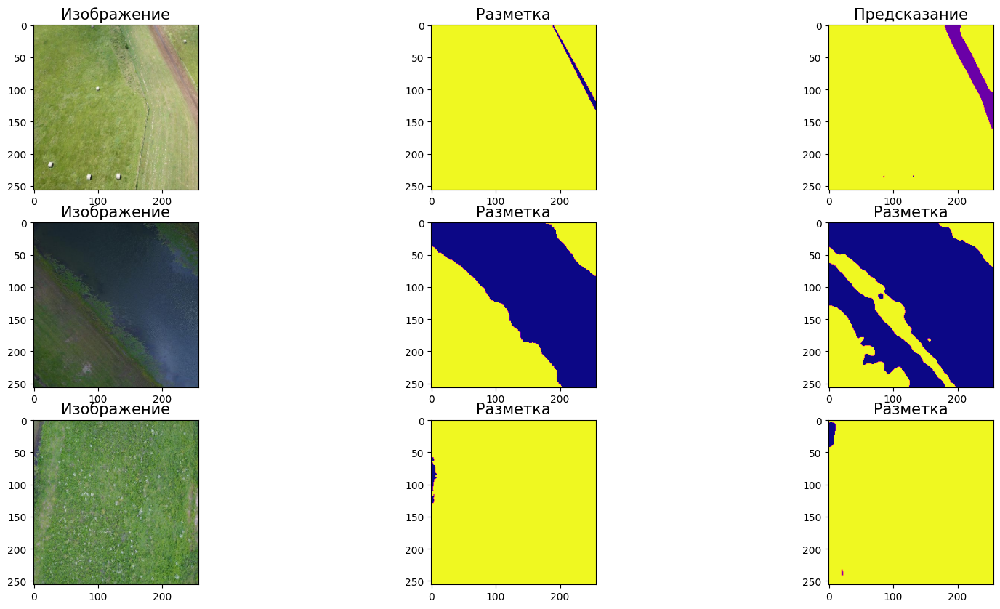

In [33]:
image_1, mask_1 = train_dataset[0]
image_1 =  image_1.to(device)
prediction_1 = m(image_1.unsqueeze(0))
prediction_1 = torch.argmax(prediction_1, dim=1).cpu()
image_1 = image_1.cpu()

image_2, mask_2 = train_dataset[1]
image_2 =  image_2.to(device)
prediction_2 = m(image_2.unsqueeze(0))
prediction_2 = torch.argmax(prediction_2, dim=1).cpu()
image_2 = image_2.cpu()

image_3, mask_3 = train_dataset[2]
image_3 =  image_3.to(device)
prediction_3 = m(image_3.unsqueeze(0))
prediction_3 = torch.argmax(prediction_3, dim=1).cpu()
image_3 =  image_3.cpu()

plt.figure(figsize=(20, 10))

plt.subplot(3, 3, 1)
plt.imshow(np.transpose(image_1, (1, 2, 0)))
plt.title("Изображение", fontsize=15)

plt.subplot(3, 3, 2)
plt.imshow(mask_1, cmap='plasma')
plt.title("Разметка", fontsize=15)

plt.subplot(3, 3, 3)
plt.imshow(prediction_1[0], cmap='plasma')
plt.title("Предсказание", fontsize=15)

plt.subplot(3, 3, 4)
plt.imshow(np.transpose(image_2, (1, 2, 0)))
plt.title("Изображение", fontsize=15)

plt.subplot(3, 3, 5)
plt.imshow(mask_2, cmap='plasma')
plt.title("Разметка", fontsize=15)

plt.subplot(3, 3, 6)
plt.imshow(prediction_2[0], cmap='plasma')
plt.title("Разметка", fontsize=15)

plt.subplot(3, 3, 7)
plt.imshow(np.transpose(image_3, (1, 2, 0)))
plt.title("Изображение", fontsize=15)

plt.subplot(3, 3, 8)
plt.imshow(mask_3, cmap='plasma')
plt.title("Разметка", fontsize=15)

plt.subplot(3, 3, 9)
plt.imshow(prediction_3[0], cmap='plasma')
plt.title("Разметка", fontsize=15)

plt.show()

Как мы видим, модель неплохо предсказывает. Метрика mAcc достаточно плоха, так как с самого начала обучения, она показывает большое значение.

## Часть 2: Ваше решение (2/3 от максимального числа баллов)

В данной задаче предстоит выбить скор 45 mAcc на валидации.

Для решения можно использовать любые фреймворки, методы, модели.

Рекомендация к решению:
- Удобно будет воспользоваться предобученными моделями из [mmsegmentation](https://mmsegmentation.readthedocs.io/)
- Для реализации аугментаций вы можете воспользоваться библиотекой [albumentations](https://albumentations.ai/docs/)


В качестве решения вам нужно предоставить:

- checkpoint вашей модели.
- скрипт с загрузкой модели и её инференса вашей модели на валидационной выборке.
- отчет о решении в TeX / Markdown.

Отчет должен включать себя:

- описание финального решения. Какие техники/методы/архитектуры вы использовали. Также в эту часть должны быть включены кривые обучения для финального решения (Cross entropy loss, mean IoU, mean Acc). Для кривых обучения можете использовать tensorboard logs.

- описание промежуточных экспериментов, которые показывают процесс ваших размышлений при выборе тех или иных решений.

### Ваше решение

In [60]:
device='cuda:0'

m = smp.Unet(encoder_name="resnet34", encoder_weights="imagenet", in_channels=3, classes=8).to(device)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:01<00:00, 72.1MB/s]


In [62]:
criterion = nn.CrossEntropyLoss()
optim = torch.optim.Adam(m.parameters(), lr=1e-4)
tb = SummaryWriter()

global_step = 0
for epoch in range(100):
    m.train()
    for batch in tqdm.tqdm(train_dataloader, position=0):
        x, y = batch[0].to(device), batch[1].to(device)
        pred = m(x)
        loss = criterion(pred, y)

        tb.add_scalar("train_loss", loss.item(), global_step)
        optim.zero_grad()
        loss.backward()
        optim.step()

        global_step += 1

    intersection, union, target = 0.0, 0.0, 0.0
    with torch.no_grad():
        m.eval()
        for batch in tqdm.tqdm(val_dataloader):
            x, y = batch[0].to(device), batch[1].to(device)
            pred = m(x)

            loss = criterion(pred, y)

            tmp_intersection, tmp_union, tmp_target = calc_val_data(pred, y, 8)
            intersection += tmp_intersection.sum(0)
            union += tmp_union.sum(0)
            target += tmp_target.sum(0)

    mean_iou, mean_class_rec, mean_acc = calc_val_loss(intersection, union, target, eps = 1e-7)

    print(f"Epoch {epoch}, val_mIoU={mean_iou}, val_mRecall={mean_class_rec}, val_mAcc={mean_acc}")
    tb.add_scalar("val_mean_iou", mean_iou, epoch)
    tb.add_scalar("val_mean_class_rec", mean_class_rec, epoch)
    tb.add_scalar("val_mean_acc", mean_acc, epoch)

100%|██████████| 35/35 [00:02<00:00, 14.17it/s]


Epoch 0, val_mIoU=0.2700595557689667, val_mRecall=0.39750123023986816, val_mAcc=0.909932017326355


100%|██████████| 35/35 [00:00<00:00, 43.07it/s]


Epoch 1, val_mIoU=0.2545703649520874, val_mRecall=0.3538261651992798, val_mAcc=0.9105464220046997


100%|██████████| 35/35 [00:00<00:00, 47.39it/s]


Epoch 2, val_mIoU=0.2574687898159027, val_mRecall=0.3720640242099762, val_mAcc=0.9055085182189941


100%|██████████| 35/35 [00:01<00:00, 27.83it/s]


Epoch 3, val_mIoU=0.2996666133403778, val_mRecall=0.3965553641319275, val_mAcc=0.9248978495597839


100%|██████████| 35/35 [00:00<00:00, 48.01it/s]


Epoch 4, val_mIoU=0.30447956919670105, val_mRecall=0.38204225897789, val_mAcc=0.9225744009017944


100%|██████████| 35/35 [00:01<00:00, 28.41it/s]


Epoch 5, val_mIoU=0.34348297119140625, val_mRecall=0.4285343289375305, val_mAcc=0.9325823187828064


100%|██████████| 35/35 [00:00<00:00, 47.30it/s]


Epoch 6, val_mIoU=0.32830917835235596, val_mRecall=0.43231457471847534, val_mAcc=0.9295862913131714


100%|██████████| 35/35 [00:01<00:00, 26.74it/s]


Epoch 7, val_mIoU=0.3151437044143677, val_mRecall=0.40128737688064575, val_mAcc=0.9369864463806152


100%|██████████| 35/35 [00:01<00:00, 20.21it/s]


Epoch 8, val_mIoU=0.27390632033348083, val_mRecall=0.3860100507736206, val_mAcc=0.9072927832603455


100%|██████████| 35/35 [00:01<00:00, 29.04it/s]


Epoch 9, val_mIoU=0.44338029623031616, val_mRecall=0.5453336238861084, val_mAcc=0.9305446147918701


100%|██████████| 35/35 [00:00<00:00, 47.23it/s]


Epoch 10, val_mIoU=0.33813053369522095, val_mRecall=0.41294047236442566, val_mAcc=0.9412286281585693


100%|██████████| 35/35 [00:01<00:00, 28.76it/s]


Epoch 11, val_mIoU=0.38468125462532043, val_mRecall=0.4682082533836365, val_mAcc=0.938630998134613


100%|██████████| 35/35 [00:00<00:00, 46.59it/s]


Epoch 12, val_mIoU=0.407995343208313, val_mRecall=0.4863482713699341, val_mAcc=0.939049243927002


100%|██████████| 35/35 [00:01<00:00, 26.69it/s]


Epoch 13, val_mIoU=0.46227365732192993, val_mRecall=0.5362699031829834, val_mAcc=0.9553874731063843


100%|██████████| 35/35 [00:00<00:00, 46.84it/s]


Epoch 14, val_mIoU=0.37463581562042236, val_mRecall=0.4671688377857208, val_mAcc=0.9357587099075317


100%|██████████| 35/35 [00:01<00:00, 27.46it/s]


Epoch 15, val_mIoU=0.4302806556224823, val_mRecall=0.5293576717376709, val_mAcc=0.9435609579086304


100%|██████████| 35/35 [00:01<00:00, 17.81it/s]


Epoch 16, val_mIoU=0.3916078805923462, val_mRecall=0.49713370203971863, val_mAcc=0.939348578453064


100%|██████████| 35/35 [00:00<00:00, 46.57it/s]


Epoch 17, val_mIoU=0.4357265830039978, val_mRecall=0.5220291614532471, val_mAcc=0.945020854473114


100%|██████████| 35/35 [00:00<00:00, 47.37it/s]


Epoch 18, val_mIoU=0.44726112484931946, val_mRecall=0.5238833427429199, val_mAcc=0.9480378031730652


100%|██████████| 35/35 [00:00<00:00, 47.47it/s]


Epoch 19, val_mIoU=0.3975616991519928, val_mRecall=0.49205029010772705, val_mAcc=0.9393688440322876


100%|██████████| 35/35 [00:00<00:00, 45.90it/s]


Epoch 20, val_mIoU=0.4224110245704651, val_mRecall=0.5204563140869141, val_mAcc=0.9506076574325562


100%|██████████| 35/35 [00:00<00:00, 48.01it/s]


Epoch 21, val_mIoU=0.38024282455444336, val_mRecall=0.4758952260017395, val_mAcc=0.9381823539733887


100%|██████████| 35/35 [00:00<00:00, 47.55it/s]


Epoch 22, val_mIoU=0.4193224310874939, val_mRecall=0.5074240565299988, val_mAcc=0.9405106902122498


100%|██████████| 35/35 [00:01<00:00, 33.81it/s]


Epoch 23, val_mIoU=0.41254061460494995, val_mRecall=0.495694100856781, val_mAcc=0.9373016357421875


100%|██████████| 35/35 [00:00<00:00, 47.85it/s]


Epoch 24, val_mIoU=0.44022703170776367, val_mRecall=0.5145889520645142, val_mAcc=0.9510417580604553


100%|██████████| 35/35 [00:01<00:00, 29.96it/s]


Epoch 25, val_mIoU=0.4208051860332489, val_mRecall=0.503481924533844, val_mAcc=0.9473668932914734


100%|██████████| 35/35 [00:00<00:00, 46.64it/s]


Epoch 26, val_mIoU=0.4089447855949402, val_mRecall=0.4897525906562805, val_mAcc=0.9344422221183777


100%|██████████| 35/35 [00:01<00:00, 28.39it/s]


Epoch 27, val_mIoU=0.3920637369155884, val_mRecall=0.49802327156066895, val_mAcc=0.9321739077568054


100%|██████████| 35/35 [00:00<00:00, 47.84it/s]


Epoch 28, val_mIoU=0.4252096712589264, val_mRecall=0.5096909999847412, val_mAcc=0.9425324201583862


100%|██████████| 35/35 [00:01<00:00, 28.78it/s]


Epoch 29, val_mIoU=0.3822365701198578, val_mRecall=0.4717138111591339, val_mAcc=0.9342856407165527


100%|██████████| 35/35 [00:00<00:00, 47.13it/s]


Epoch 30, val_mIoU=0.4226836562156677, val_mRecall=0.5063809156417847, val_mAcc=0.9475119709968567


100%|██████████| 35/35 [00:01<00:00, 22.73it/s]


Epoch 31, val_mIoU=0.3855704665184021, val_mRecall=0.46806105971336365, val_mAcc=0.9402610659599304


100%|██████████| 35/35 [00:00<00:00, 48.53it/s]


Epoch 32, val_mIoU=0.39273589849472046, val_mRecall=0.48924005031585693, val_mAcc=0.9345524311065674


100%|██████████| 35/35 [00:01<00:00, 29.19it/s]


Epoch 33, val_mIoU=0.4449053406715393, val_mRecall=0.5303789377212524, val_mAcc=0.9541468024253845


100%|██████████| 35/35 [00:00<00:00, 47.63it/s]


Epoch 34, val_mIoU=0.3721095323562622, val_mRecall=0.4649958610534668, val_mAcc=0.9374443292617798


100%|██████████| 35/35 [00:01<00:00, 27.57it/s]


Epoch 35, val_mIoU=0.4224027693271637, val_mRecall=0.5062163472175598, val_mAcc=0.9434256553649902


100%|██████████| 35/35 [00:01<00:00, 27.05it/s]


Epoch 36, val_mIoU=0.42579200863838196, val_mRecall=0.5092650651931763, val_mAcc=0.9431131482124329


100%|██████████| 35/35 [00:01<00:00, 27.87it/s]


Epoch 37, val_mIoU=0.40329986810684204, val_mRecall=0.5093207359313965, val_mAcc=0.9372336268424988


100%|██████████| 35/35 [00:00<00:00, 47.96it/s]


Epoch 38, val_mIoU=0.4218323826789856, val_mRecall=0.5011938810348511, val_mAcc=0.9506625533103943


100%|██████████| 35/35 [00:01<00:00, 27.57it/s]


Epoch 39, val_mIoU=0.4293258786201477, val_mRecall=0.519193172454834, val_mAcc=0.9447895288467407


100%|██████████| 35/35 [00:00<00:00, 48.66it/s]


Epoch 40, val_mIoU=0.42866086959838867, val_mRecall=0.5115850567817688, val_mAcc=0.9503615498542786


100%|██████████| 35/35 [00:01<00:00, 28.57it/s]


Epoch 41, val_mIoU=0.4517940878868103, val_mRecall=0.5336087942123413, val_mAcc=0.9459105134010315


100%|██████████| 35/35 [00:00<00:00, 47.06it/s]


Epoch 42, val_mIoU=0.43382659554481506, val_mRecall=0.5152076482772827, val_mAcc=0.950650691986084


100%|██████████| 35/35 [00:01<00:00, 27.63it/s]


Epoch 43, val_mIoU=0.33055415749549866, val_mRecall=0.41429513692855835, val_mAcc=0.9180521965026855


100%|██████████| 35/35 [00:00<00:00, 47.71it/s]


Epoch 44, val_mIoU=0.3879040479660034, val_mRecall=0.49141502380371094, val_mAcc=0.9387843608856201


100%|██████████| 35/35 [00:01<00:00, 28.03it/s]


Epoch 45, val_mIoU=0.44378161430358887, val_mRecall=0.5121942758560181, val_mAcc=0.9508157968521118


100%|██████████| 35/35 [00:00<00:00, 46.80it/s]


Epoch 46, val_mIoU=0.4264872670173645, val_mRecall=0.5104591846466064, val_mAcc=0.9537346363067627


100%|██████████| 35/35 [00:01<00:00, 27.87it/s]


Epoch 47, val_mIoU=0.4118316173553467, val_mRecall=0.49597445130348206, val_mAcc=0.9488186836242676


100%|██████████| 35/35 [00:00<00:00, 47.72it/s]


Epoch 48, val_mIoU=0.4538487493991852, val_mRecall=0.5338688492774963, val_mAcc=0.9508101940155029


100%|██████████| 35/35 [00:01<00:00, 30.14it/s]


Epoch 49, val_mIoU=0.4058908224105835, val_mRecall=0.48634228110313416, val_mAcc=0.9445374608039856


100%|██████████| 35/35 [00:00<00:00, 47.26it/s]


Epoch 50, val_mIoU=0.45650041103363037, val_mRecall=0.5220648050308228, val_mAcc=0.9517309665679932


100%|██████████| 35/35 [00:00<00:00, 47.43it/s]


Epoch 51, val_mIoU=0.4249785542488098, val_mRecall=0.5069644451141357, val_mAcc=0.9437640905380249


100%|██████████| 35/35 [00:00<00:00, 47.00it/s]


Epoch 52, val_mIoU=0.4260934889316559, val_mRecall=0.5125635862350464, val_mAcc=0.9430171251296997


100%|██████████| 35/35 [00:00<00:00, 46.97it/s]


Epoch 53, val_mIoU=0.41677579283714294, val_mRecall=0.49789735674858093, val_mAcc=0.9369246959686279


100%|██████████| 35/35 [00:00<00:00, 46.37it/s]


Epoch 54, val_mIoU=0.4076036214828491, val_mRecall=0.4967312514781952, val_mAcc=0.9429565668106079


100%|██████████| 35/35 [00:00<00:00, 47.83it/s]


Epoch 55, val_mIoU=0.46078380942344666, val_mRecall=0.5297505855560303, val_mAcc=0.9538382291793823


100%|██████████| 35/35 [00:00<00:00, 46.76it/s]


Epoch 56, val_mIoU=0.43922799825668335, val_mRecall=0.5293494462966919, val_mAcc=0.9500486850738525


100%|██████████| 35/35 [00:00<00:00, 47.40it/s]


Epoch 57, val_mIoU=0.410261332988739, val_mRecall=0.5014387965202332, val_mAcc=0.9433383941650391


100%|██████████| 35/35 [00:01<00:00, 29.81it/s]


Epoch 58, val_mIoU=0.4430704116821289, val_mRecall=0.5321741104125977, val_mAcc=0.9477107524871826


100%|██████████| 35/35 [00:00<00:00, 44.90it/s]


Epoch 59, val_mIoU=0.39881646633148193, val_mRecall=0.49783334136009216, val_mAcc=0.9337266683578491


100%|██████████| 35/35 [00:01<00:00, 28.89it/s]


Epoch 60, val_mIoU=0.40004271268844604, val_mRecall=0.48880863189697266, val_mAcc=0.9412598013877869


100%|██████████| 35/35 [00:00<00:00, 47.96it/s]


Epoch 61, val_mIoU=0.34387707710266113, val_mRecall=0.4442512094974518, val_mAcc=0.9234627485275269


100%|██████████| 35/35 [00:01<00:00, 27.11it/s]


Epoch 62, val_mIoU=0.45222920179367065, val_mRecall=0.5245300531387329, val_mAcc=0.9528769254684448


100%|██████████| 35/35 [00:00<00:00, 45.84it/s]


Epoch 63, val_mIoU=0.4335983395576477, val_mRecall=0.5161009430885315, val_mAcc=0.9444358944892883


100%|██████████| 35/35 [00:01<00:00, 28.74it/s]


Epoch 64, val_mIoU=0.34194594621658325, val_mRecall=0.4360547661781311, val_mAcc=0.9254187345504761


100%|██████████| 35/35 [00:00<00:00, 47.11it/s]


Epoch 65, val_mIoU=0.4124893546104431, val_mRecall=0.4850739538669586, val_mAcc=0.942663311958313


100%|██████████| 35/35 [00:01<00:00, 29.39it/s]


Epoch 66, val_mIoU=0.41791269183158875, val_mRecall=0.4901794195175171, val_mAcc=0.9455737471580505


100%|██████████| 35/35 [00:00<00:00, 44.53it/s]


Epoch 67, val_mIoU=0.43643492460250854, val_mRecall=0.5157691240310669, val_mAcc=0.9490962624549866


100%|██████████| 35/35 [00:00<00:00, 41.61it/s]


Epoch 68, val_mIoU=0.4378926157951355, val_mRecall=0.5116706490516663, val_mAcc=0.9498283863067627


100%|██████████| 35/35 [00:00<00:00, 47.31it/s]


Epoch 69, val_mIoU=0.43285226821899414, val_mRecall=0.5137615203857422, val_mAcc=0.942731499671936


100%|██████████| 35/35 [00:00<00:00, 49.57it/s]


Epoch 70, val_mIoU=0.42582568526268005, val_mRecall=0.5041692852973938, val_mAcc=0.9438668489456177


100%|██████████| 35/35 [00:00<00:00, 46.78it/s]


Epoch 71, val_mIoU=0.40958118438720703, val_mRecall=0.4877791106700897, val_mAcc=0.9455354809761047


100%|██████████| 35/35 [00:00<00:00, 47.53it/s]


Epoch 72, val_mIoU=0.33696311712265015, val_mRecall=0.438791960477829, val_mAcc=0.922116756439209


100%|██████████| 35/35 [00:00<00:00, 46.69it/s]


Epoch 73, val_mIoU=0.3990160822868347, val_mRecall=0.4764067530632019, val_mAcc=0.9397984147071838


100%|██████████| 35/35 [00:00<00:00, 45.95it/s]


Epoch 74, val_mIoU=0.4194830656051636, val_mRecall=0.5075287222862244, val_mAcc=0.9440191984176636


100%|██████████| 35/35 [00:01<00:00, 33.65it/s]


Epoch 75, val_mIoU=0.4079636335372925, val_mRecall=0.49004000425338745, val_mAcc=0.9394277334213257


100%|██████████| 35/35 [00:00<00:00, 46.25it/s]


Epoch 76, val_mIoU=0.3993505537509918, val_mRecall=0.48709636926651, val_mAcc=0.9306156635284424


100%|██████████| 35/35 [00:01<00:00, 29.50it/s]


Epoch 77, val_mIoU=0.40919333696365356, val_mRecall=0.5051411986351013, val_mAcc=0.944588303565979


100%|██████████| 35/35 [00:00<00:00, 45.55it/s]


Epoch 78, val_mIoU=0.39515388011932373, val_mRecall=0.4767748713493347, val_mAcc=0.9389299750328064


100%|██████████| 35/35 [00:01<00:00, 27.56it/s]


Epoch 79, val_mIoU=0.579194188117981, val_mRecall=0.6433187127113342, val_mAcc=0.9542477130889893


100%|██████████| 35/35 [00:00<00:00, 46.47it/s]


Epoch 80, val_mIoU=0.4183672070503235, val_mRecall=0.5146140456199646, val_mAcc=0.9407842755317688


100%|██████████| 35/35 [00:01<00:00, 26.31it/s]


Epoch 81, val_mIoU=0.42670342326164246, val_mRecall=0.5080910921096802, val_mAcc=0.9420738220214844


100%|██████████| 35/35 [00:00<00:00, 47.59it/s]


Epoch 82, val_mIoU=0.3911922574043274, val_mRecall=0.467151939868927, val_mAcc=0.9419773817062378


100%|██████████| 35/35 [00:01<00:00, 27.02it/s]


Epoch 83, val_mIoU=0.38152337074279785, val_mRecall=0.4711769223213196, val_mAcc=0.937609851360321


100%|██████████| 35/35 [00:00<00:00, 43.98it/s]


Epoch 84, val_mIoU=0.4056910276412964, val_mRecall=0.49372267723083496, val_mAcc=0.9403237104415894


100%|██████████| 35/35 [00:01<00:00, 28.31it/s]


Epoch 85, val_mIoU=0.39322566986083984, val_mRecall=0.4874681532382965, val_mAcc=0.9411075115203857


100%|██████████| 35/35 [00:00<00:00, 47.07it/s]


Epoch 86, val_mIoU=0.4064553380012512, val_mRecall=0.4836796820163727, val_mAcc=0.9403737783432007


100%|██████████| 35/35 [00:01<00:00, 29.31it/s]


Epoch 87, val_mIoU=0.3917596936225891, val_mRecall=0.4896671772003174, val_mAcc=0.9368128180503845


100%|██████████| 35/35 [00:00<00:00, 48.34it/s]


Epoch 88, val_mIoU=0.43107613921165466, val_mRecall=0.5142613649368286, val_mAcc=0.9455533027648926


100%|██████████| 35/35 [00:01<00:00, 30.01it/s]


Epoch 89, val_mIoU=0.4687318801879883, val_mRecall=0.5379325151443481, val_mAcc=0.9568879008293152


100%|██████████| 35/35 [00:00<00:00, 47.86it/s]


Epoch 90, val_mIoU=0.40431463718414307, val_mRecall=0.4825495481491089, val_mAcc=0.937198281288147


100%|██████████| 35/35 [00:00<00:00, 45.35it/s]


Epoch 91, val_mIoU=0.43256208300590515, val_mRecall=0.5262115001678467, val_mAcc=0.941818356513977


100%|██████████| 35/35 [00:00<00:00, 47.15it/s]


Epoch 92, val_mIoU=0.4109536111354828, val_mRecall=0.5000798106193542, val_mAcc=0.9376996755599976


100%|██████████| 35/35 [00:00<00:00, 47.59it/s]


Epoch 93, val_mIoU=0.42735791206359863, val_mRecall=0.5043689012527466, val_mAcc=0.9410555362701416


100%|██████████| 35/35 [00:00<00:00, 47.88it/s]


Epoch 94, val_mIoU=0.45158037543296814, val_mRecall=0.5209352970123291, val_mAcc=0.9554109573364258


100%|██████████| 35/35 [00:00<00:00, 46.66it/s]


Epoch 95, val_mIoU=0.4589710533618927, val_mRecall=0.521425187587738, val_mAcc=0.9501312375068665


100%|██████████| 35/35 [00:00<00:00, 42.46it/s]


Epoch 96, val_mIoU=0.5625370740890503, val_mRecall=0.6277440786361694, val_mAcc=0.9561249017715454


100%|██████████| 35/35 [00:00<00:00, 45.66it/s]


Epoch 97, val_mIoU=0.4623992145061493, val_mRecall=0.545133650302887, val_mAcc=0.9463435411453247


100%|██████████| 35/35 [00:01<00:00, 28.26it/s]


Epoch 98, val_mIoU=0.39280080795288086, val_mRecall=0.49299412965774536, val_mAcc=0.9422973394393921


100%|██████████| 35/35 [00:00<00:00, 46.29it/s]

Epoch 99, val_mIoU=0.3843337297439575, val_mRecall=0.4733227789402008, val_mAcc=0.9367240071296692


In [63]:
%load_ext tensorboard
%tensorboard --logdir runs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

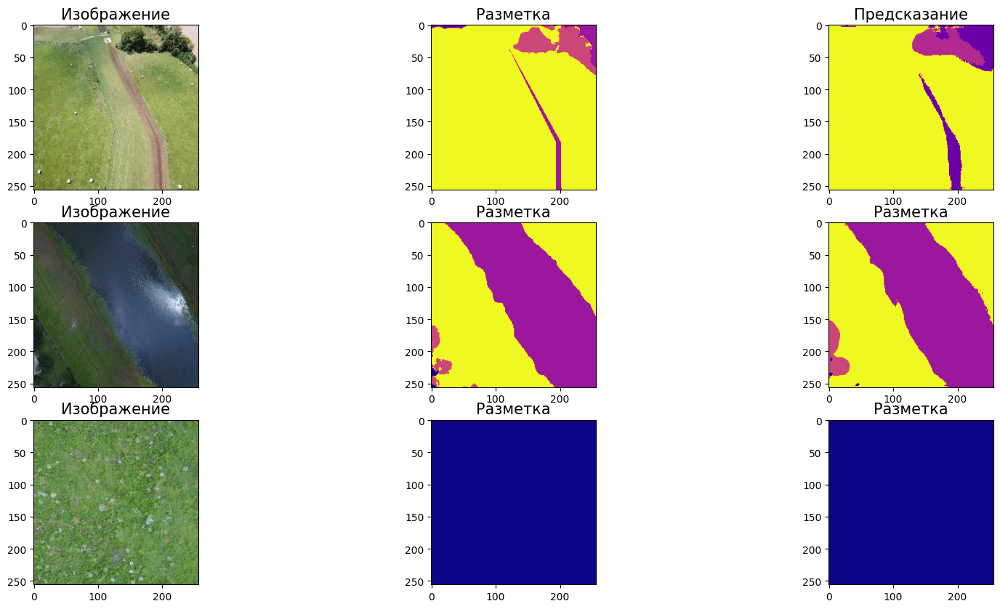

In [64]:
image_1, mask_1 = train_dataset[0]
image_1 =  image_1.to(device)
prediction_1 = m(image_1.unsqueeze(0))
prediction_1 = torch.argmax(prediction_1, dim=1).cpu()
image_1 = image_1.cpu()

image_2, mask_2 = train_dataset[1]
image_2 =  image_2.to(device)
prediction_2 = m(image_2.unsqueeze(0))
prediction_2 = torch.argmax(prediction_2, dim=1).cpu()
image_2 = image_2.cpu()

image_3, mask_3 = train_dataset[2]
image_3 =  image_3.to(device)
prediction_3 = m(image_3.unsqueeze(0))
prediction_3 = torch.argmax(prediction_3, dim=1).cpu()
image_3 =  image_3.cpu()

plt.figure(figsize=(20, 10))

plt.subplot(3, 3, 1)
plt.imshow(np.transpose(image_1, (1, 2, 0)))
plt.title("Изображение", fontsize=15)

plt.subplot(3, 3, 2)
plt.imshow(mask_1, cmap='plasma')
plt.title("Разметка", fontsize=15)

plt.subplot(3, 3, 3)
plt.imshow(prediction_1[0], cmap='plasma')
plt.title("Предсказание", fontsize=15)

plt.subplot(3, 3, 4)
plt.imshow(np.transpose(image_2, (1, 2, 0)))
plt.title("Изображение", fontsize=15)

plt.subplot(3, 3, 5)
plt.imshow(mask_2, cmap='plasma')
plt.title("Разметка", fontsize=15)

plt.subplot(3, 3, 6)
plt.imshow(prediction_2[0], cmap='plasma')
plt.title("Разметка", fontsize=15)

plt.subplot(3, 3, 7)
plt.imshow(np.transpose(image_3, (1, 2, 0)))
plt.title("Изображение", fontsize=15)

plt.subplot(3, 3, 8)
plt.imshow(mask_3, cmap='plasma')
plt.title("Разметка", fontsize=15)

plt.subplot(3, 3, 9)
plt.imshow(prediction_3[0], cmap='plasma')
plt.title("Разметка", fontsize=15)

plt.show()

Как мы видим, полученное качество у данной модели сильно лучше, чем у предыдущей:

mIoU: было 0.283, стало 0.462;

mRecall: было 0.373, стало 0.545;

mAcc: было 0.916, стало 0.946.
